# Problema 3
Descripción:
En este problema, se proporciona un conjunto de datos que contiene imágenes de escenas naturales de todo el mundo. El objetivo es construir un modelo de clasificación utilizando redes neuronales convolucionales (CNN) para clasificar estas imágenes en una de las seis categorías predefinidas.


## Dataset:
https://drive.google.com/file/d/1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ/view?usp=drive_link

El dataset proporcionado contiene alrededor de 25,000 imágenes de tamaño 150x150, distribuidas en seis categorías:

- buildings
- forest
- glacier
- mountain
- sea
- street

Las imágenes están divididas en tres conjuntos:

- Train: Alrededor de 14,000 imágenes para entrenamiento.
- Test: Alrededor de 3,000 imágenes para evaluación del modelo.
- Prediction: Alrededor de 7,000 imágenes para predicción final.

## Objetivo:

Utilizando el dataset proporcionado, el objetivo es construir y comparar el rendimiento de distintos modelos de clasificación de imágenes utilizando redes neuronales convolucionales y densas que puedan clasificar con precisión las imágenes de escenas naturales en una de las seis categorías mencionadas anteriormente.
Los modelos a diseñar son:

- Modelo con capas densas.
- Modelo con capas convolucionales y densas.
- Modelo que incluya bloques residuales identidad
- Modelo que utilice como backbone alguna de las arquitecturas disponibles en TensorFlow (transfer learning): https://www.tensorflow.org/api_docs/python/tf/keras/applications

Se debe entrenar y evaluar cada modelo utilizando técnicas adecuadas de validación y métricas de evaluación de clasificación.


## Entrega:

La entrega debe incluir:

Código fuente de la solución implementada en Google Colab, que incluya:

- Análisis previo y preprocesamiento del set de datos.
- Definición y entrenamiento del modelo.
- Resultados de la evaluación del modelo, incluyendo métricas de desempeño y visualizaciones relevantes.

Nota: el código debe estar debidamente documentado con comentarios explicativos para que el trabajo sea fácilmente comprensible para otros revisores.


## Librerias

In [2]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

2025-05-11 17:05:43.011506: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-11 17:05:43.348436: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2025-05-11 17:05:46.567071: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-11 17:05:46.596804: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-11 17:05:46.597267: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


In [3]:
# Configurar para que TensorFlow utilice la GPU por defecto
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Configurar para que TensorFlow asigne memoria dinámicamente
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Especificar la GPU por defecto
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Manejar error
        print(e)

1 Physical GPUs, 1 Logical GPUs


2025-05-11 17:05:46.613433: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-11 17:05:46.613977: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-11 17:05:46.614420: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-11 17:05:46.775069: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-11 17:05:46.775407: I tensorflow/compile

In [4]:
print("CUDA:", tf.sysconfig.get_build_info()["cuda_version"])
print("cuDNN:", tf.sysconfig.get_build_info()["cudnn_version"])

CUDA: 11.8
cuDNN: 8


In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from pathlib import Path
from keras.layers import Input, RandomFlip, RandomContrast, BatchNormalization, RandomTranslation, Flatten, Dropout
from keras.layers import Dense, Conv2D, Activation, MaxPooling2D, GlobalMaxPooling2D, Rescaling
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import numpy as np
import os
from tensorflow.keras import regularizers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import multilabel_confusion_matrix

## Funciones

In [20]:
def calcular_metricas_modelos(y_trues, y_preds, model_names, class_names):
    filas = []

    for y_true, y_pred, model_name in zip(y_trues, y_preds, model_names):
        mcm = multilabel_confusion_matrix(y_true, y_pred, labels=range(len(class_names)))
        acc_global = accuracy_score(y_true, y_pred)
        prec_macro = precision_score(y_true, y_pred, average='macro', zero_division=0)
        rec_macro = recall_score(y_true, y_pred, average='macro', zero_division=0)
        f1_macro = f1_score(y_true, y_pred, average='macro', zero_division=0)

        for i, class_name in enumerate(class_names):
            tn, fp, fn, tp = mcm[i].ravel()

            acc = (tp + tn) / (tp + tn + fp + fn)
            prec = tp / (tp + fp)
            rec = tp / (tp + fn)
            f1 = (2 * prec * rec / (prec + rec))

            filas.append({ "Modelo": model_name, "Clase": class_name,"Accuracy (%)": acc, "Precisión (%)": prec, "Recall (%)": rec, "F1-Score (%)": f1 })

        filas.append({ "Modelo": model_name, "Clase": "PROMEDIO", "Accuracy (%)": acc_global, "Precisión (%)": prec_macro, "Recall (%)": rec_macro, "F1-Score (%)": f1_macro })
    return pd.DataFrame(filas)

In [21]:
def calcular_metricas(y_true, y_pred, class_names):
    precision = precision_score(y_true, y_pred, average=None, zero_division=0)
    recall = recall_score(y_true, y_pred, average=None, zero_division=0)
    f1 = f1_score(y_true, y_pred, average=None, zero_division=0)

    data = { 'Clase': class_names, 'Precisión (%)': precision, 'Recall (%)': recall,'F1-Score (%)': f1 }

    df_metricas = pd.DataFrame(data)
    return df_metricas

## Carga del dataset

Se cargan los datos de entrenamiento y testeo que están anteriormente clasificados, luego los de validación para realizar una verificación visual de los resultados del modelo.

In [12]:
# Directorio de los datos
directory = os.getcwd()
TRAIN_DATA_DIRECTORY = str(Path(f'{directory}/seg_train/seg_train'))
VALIDATION_DATA_DIRECTORY = str(Path(f'{directory}/seg_test/seg_test'))
PREDICTION_DATA_DIRECTORY = str(Path(f'{directory}/seg_pred'))

# Tamaño del lote (batch size)
BATCH_SIZE = 32

# Tamaño de las imágenes
IMAGE_HEIGHT = 150
IMAGE_WIDTH = 150

# Carga los datos de entrenamiento, testeo y validación

#train -> 6 clases
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DATA_DIRECTORY,
    label_mode="categorical",
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

#test -> 6 clases
val_ds = tf.keras.utils.image_dataset_from_directory(
    VALIDATION_DATA_DIRECTORY,
    label_mode="categorical",
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

#validacion -> 1 clases
pred_ds = tf.keras.utils.image_dataset_from_directory(
    VALIDATION_DATA_DIRECTORY,
    labels=None,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE,
)

Found 14034 files belonging to 6 classes.
Found 3000 files belonging to 6 classes.
Found 3000 files belonging to 1 classes.


Se busca conocer la distribución de datos para cada clase

In [9]:
dir = './seg_train/seg_train'
labels = os.listdir(dir)
cant_imgs = []

for label in labels:
    cant_imgs.append(len(os.listdir(f'{dir}/{label}')))

class_names = train_ds.class_names
num_classes = len(class_names)

print(class_names)
print(cant_imgs)

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
[2404, 2191, 2274, 2382, 2512, 2271]


Se puede ver que los datos están cerca de tener una distribución uniforme entre las diferentes clases.

También, mostramos 9 ejemplos aleatorios del dataset de entrenamiento para así visualizar con qué tipo de imágenes vamos a trabajar.

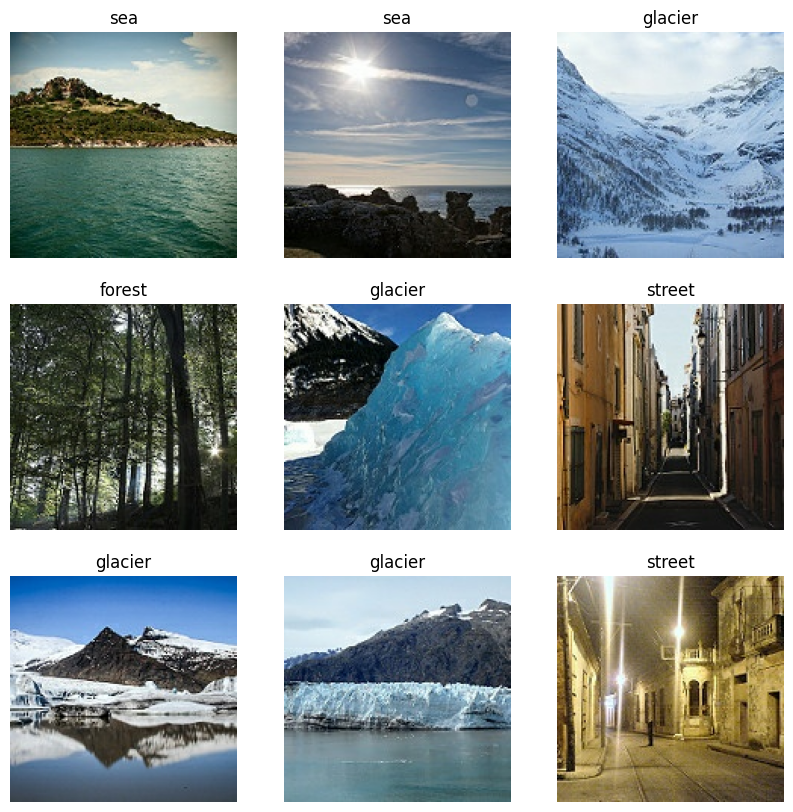

In [9]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))

    class_idx = labels[i].numpy()

    if len(class_idx.shape) > 0 and class_idx.shape[0] > 1:
        class_idx = np.argmax(class_idx)
    else:
        class_idx = int(class_idx)
        
    plt.title(class_names[class_idx])
    plt.axis("off")

## Modelo denso

Para el modelo denso, se tomó la decisión de utilizar 3 capas densas de 32, 64 y 128, respectivamente. También se realizó batchnormalization, drop out y regularización, todo esto para que el modelo no se mostrara demasiado sobre entrenado, esto debido a que únicamente utilizar capas densas para la clasificación de las 6 clases, resulta ineficiente.
También, debido a esto último, decidimos no agregar más capas o aumentar la cantidad de neuronas, ya que no se aprecia un aumento significativo en las métricas del modelo. Más aún, teniendo en cuenta que es un modelo de más de 1 millón de parámetros, tomamos la decisión de no seguir dimensionándolo. 

In [10]:
data_augmentation = models.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomTranslation(0.1, 0.1, fill_mode="reflect"),
    layers.RandomContrast(0.2),
])

dense_model = models.Sequential([
    layers.Rescaling(1./255, input_shape=(150, 150, 3)),
    data_augmentation,
    layers.Flatten(),
    layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.Dropout(0.15),
    layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.Dropout(0.15),
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.Dropout(0.15),
    layers.Dense(num_classes, activation='softmax')
])

dense_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 150, 150, 3)       0         
                                                                 
 sequential (Sequential)     (None, 150, 150, 3)       0         
                                                                 
 flatten (Flatten)           (None, 67500)             0         
                                                                 
 dense (Dense)               (None, 32)                2160032   
                                                                 
 batch_normalization (Batch  (None, 32)                128       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                      

Se aplica early stopping y reducción de learning rate, además de configurar de antemano el learning rate, ya que si no, el modelo mostraba grandes picos, lo que pudimos reducir disminuyendo el LR.

In [11]:
optimizer = Adam(learning_rate=0.00001)

dense_model.compile(
    optimizer=optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy'])


early_stopping = EarlyStopping(monitor="val_loss", patience=8, verbose=0, mode="min")

reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=7, verbose=1, min_delta=1e-3, mode="min")


history_dense = dense_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    batch_size=20,
    callbacks=[reduce_lr, early_stopping],
)


Epoch 1/100


2025-05-11 13:37:56.442361: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2025-05-11 13:37:56.548348: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fb0acce2980 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-11 13:37:56.548396: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4080 Laptop GPU, Compute Capability 8.9
2025-05-11 13:37:56.586393: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-11 13:37:56.648492: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2025-05-11 13:37:56.861976: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifeti

439/439 [==============================] - 10s 17ms/step - loss: 3.7697 - accuracy: 0.3212 - val_loss: 3.5863 - val_accuracy: 0.3593 - lr: 1.0000e-05
Epoch 2/100
439/439 [==============================] - 7s 15ms/step - loss: 3.5505 - accuracy: 0.3834 - val_loss: 3.3741 - val_accuracy: 0.3973 - lr: 1.0000e-05
Epoch 3/100
439/439 [==============================] - 7s 15ms/step - loss: 3.5015 - accuracy: 0.3876 - val_loss: 3.3147 - val_accuracy: 0.4413 - lr: 1.0000e-05
Epoch 4/100
439/439 [==============================] - 7s 15ms/step - loss: 3.4090 - accuracy: 0.4079 - val_loss: 3.2869 - val_accuracy: 0.4910 - lr: 1.0000e-05
Epoch 5/100
439/439 [==============================] - 7s 16ms/step - loss: 3.3753 - accuracy: 0.4160 - val_loss: 3.2268 - val_accuracy: 0.4837 - lr: 1.0000e-05
Epoch 6/100
439/439 [==============================] - 7s 16ms/step - loss: 3.3246 - accuracy: 0.4255 - val_loss: 3.1542 - val_accuracy: 0.4827 - lr: 1.0000e-05
Epoch 7/100
439/439 [========================

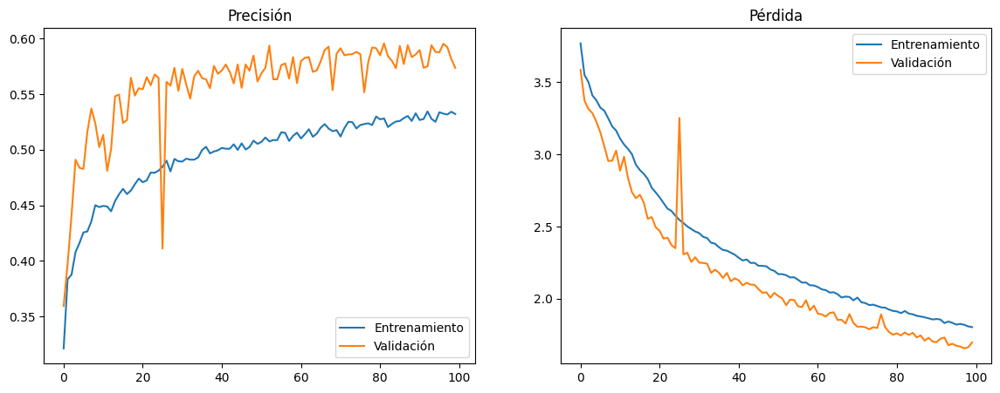

In [12]:
acc_dense = history_dense.history['accuracy']
val_acc_dense = history_dense.history['val_accuracy']

loss_dense = history_dense.history['loss']
val_loss_dense = history_dense.history['val_loss']

epochs_range = range(len(acc_dense))

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc_dense, label='Entrenamiento')
plt.plot(epochs_range, val_acc_dense, label='Validación')
plt.legend(loc='lower right')
plt.title('Precisión')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_dense, label='Entrenamiento')
plt.plot(epochs_range, val_loss_dense, label='Validación')
plt.legend(loc='upper right')
plt.title('Pérdida')

plt.show()

Según las distintas métricas de entrenamiento del modelo denso, se observa que la validación da mayores resultados que en el entrenamiento. Esto se debe a lo mencionado anteriormente, sobre aplicar drop out, bachnormalization, regularización y además data aumentation. Aun con todos estos métodos aplicados, vemos que la validación no supera por más de 0.05, lo que resulta en un buen modelo básico que no presenta sobre ajuste.

Luego, realizamos distintas validaciones con los datos de entrenamiento y validación, además de una matriz de confusión.

1/1 [==============================] - 0s 100ms/step


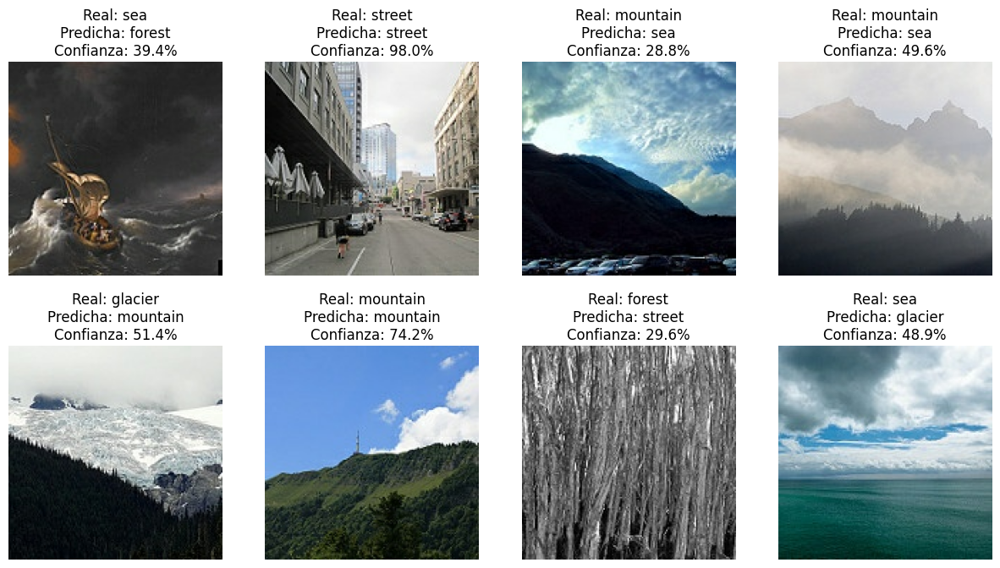

In [13]:
for images, labels in val_ds.take(1):
    preds = dense_model.predict(images)

true_classes = np.argmax(labels.numpy(), axis=1)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    confidence = np.max(preds[i]) * 100

    true_label = class_names[true_classes[i]]
    predicted_label = class_names[predicted_classes[i]]
    
    plt.title(f"Real: {true_label}\nPredicha: {predicted_label}\nConfianza: {confidence:.1f}%")
    plt.axis("off")

plt.show()

1/1 [==============================] - 0s 18ms/step


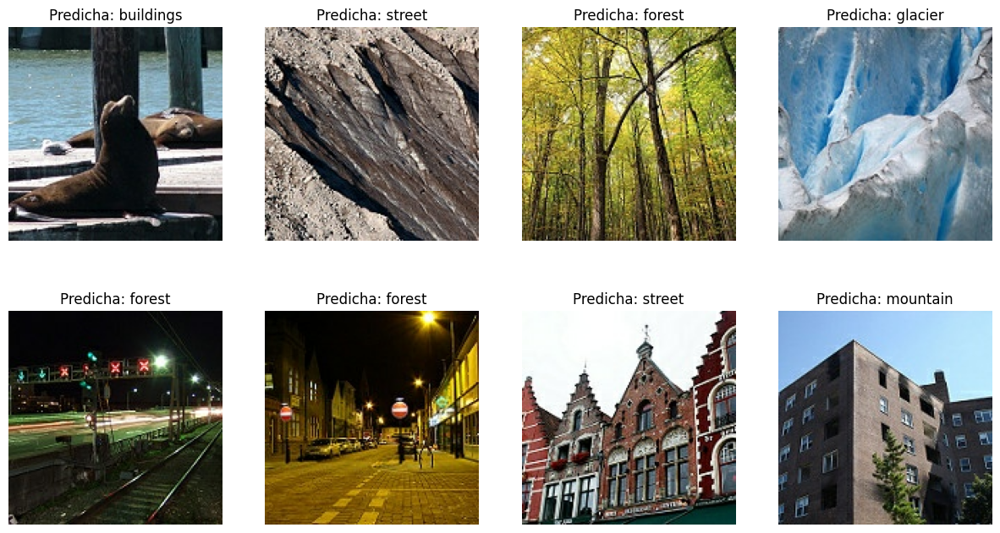

In [14]:
images_batch = next(iter(pred_ds.take(1)))
preds = dense_model.predict(images_batch)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images_batch[i].numpy().astype("uint8"))

    predicted_label = class_names[predicted_classes[i]]
    plt.title(f"Predicha: {predicted_label}")
    plt.axis("off")

plt.show()

Como podemos notar, para ambos casos, de testeo y validación, el modelo no resulta ser demasiado preciso, ni en los casos donde acierta ni en los que no. Aunque logre predecir de manera correcta varios ejemplos.

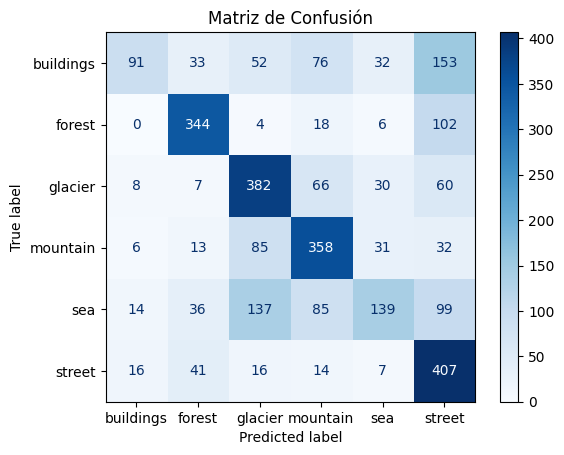

In [15]:
y_true = []
y_pred = []

for images, labels in val_ds:
    preds = dense_model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))


cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues')
plt.title("Matriz de Confusión")
plt.show()

In [82]:
calcular_metricas(y_true, y_pred, class_names)

,Clase,Precisión (%),Recall (%),F1-Score (%)
0,buildings,0.674074,0.208238,0.318182
1,forest,0.725738,0.725738,0.725738
2,glacier,0.565089,0.690778,0.621644
3,mountain,0.580227,0.681905,0.626970
4,sea,0.567347,0.272549,0.368212
5,street,0.477140,0.812375,0.601182


En la matriz de confusión podemos ver que los bosques suelen ser la clase con mayor precisión (70.74%), recall (77.00%) y f1-score (73.74%).

## Modelo convolucional

Para el modelo con capas convolucionales, pensamos en utilizar 3 maxpooling/conv2D y 4 capas densas, siguiendo con los ejemplos que fueron presentados en clase. También, al momento de calcular cuántas neuronas aplicar a cada capa, tomamos la decisión de realizar un modelo con menor cantidad de parámetros, ya que así podríamos realizar un modelo pequeño en términos de parámetros y dándonos muy buenos resultados.

In [39]:
def build_model_conv(input_shape):
    i = Input(input_shape, dtype=tf.float32)

    x = Rescaling(1./255)(i)
    x = RandomFlip("horizontal")(x)                  
    x = RandomFlip("vertical")(x)                              
    x = RandomTranslation(0.1, 0.1, fill_mode="reflect")(x) 
    x = RandomContrast(0.2)(x)                                 

    x = Conv2D(8, (3, 3))(x)
    x = Activation("relu")(x)

    x = Conv2D(16, (3, 3))(x)
    x = Activation("relu")(x)

    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(32, (3, 3))(x)
    x = Activation("relu")(x)

    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(64, (3, 3))(x)
    x = Activation("relu")(x)

    x = MaxPooling2D((2, 2))(x)

    x = Flatten()(x)
    x = Dropout(0.3)(x)
    x = Dense(6)(x)
    x = Activation("softmax")(x)
    return tf.keras.Model(inputs=i, outputs=x)

print("Building model")
conv_model = build_model_conv(input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

optimizer = Adam(learning_rate=0.0005)

conv_model.compile(
    optimizer=optimizer,
    loss="categorical_crossentropy",
    metrics=['accuracy'])

conv_model.summary()

Building model
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 rescaling_4 (Rescaling)     (None, 150, 150, 3)       0         
                                                                 
 random_flip_5 (RandomFlip)  (None, 150, 150, 3)       0         
                                                                 
 random_flip_6 (RandomFlip)  (None, 150, 150, 3)       0         
                                                                 
 random_translation_3 (Rand  (None, 150, 150, 3)       0         
 omTranslation)                                                  
                                                                 
 random_contrast_3 (RandomC  (None, 150, 150, 3)       0         
 ontrast)                                   

In [40]:
early_stopping = EarlyStopping(monitor="val_loss", patience=8, verbose=0, mode="min", restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(
    monitor="loss", factor=0.5, patience=7, verbose=1, min_delta=1e-4, mode="min"
)

history_conv = conv_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=70,
    batch_size=32,
    callbacks=[reduce_lr, early_stopping],
)

Epoch 1/70


439/439 [==============================] - 9s 18ms/step - loss: 1.1426 - accuracy: 0.5410 - val_loss: 0.9495 - val_accuracy: 0.6530 - lr: 5.0000e-04
Epoch 2/70
439/439 [==============================] - 7s 16ms/step - loss: 0.9044 - accuracy: 0.6543 - val_loss: 0.7999 - val_accuracy: 0.7033 - lr: 5.0000e-04
Epoch 3/70
439/439 [==============================] - 7s 16ms/step - loss: 0.8046 - accuracy: 0.6974 - val_loss: 0.6892 - val_accuracy: 0.7520 - lr: 5.0000e-04
Epoch 4/70
439/439 [==============================] - 7s 16ms/step - loss: 0.7386 - accuracy: 0.7267 - val_loss: 0.7136 - val_accuracy: 0.7517 - lr: 5.0000e-04
Epoch 5/70
439/439 [==============================] - 7s 16ms/step - loss: 0.6988 - accuracy: 0.7409 - val_loss: 0.6451 - val_accuracy: 0.7660 - lr: 5.0000e-04
Epoch 6/70
439/439 [==============================] - 7s 16ms/step - loss: 0.6470 - accuracy: 0.7599 - val_loss: 0.5930 - val_accuracy: 0.7807 - lr: 5.0000e-04
Epoch 7/70
439/439 [==============================]

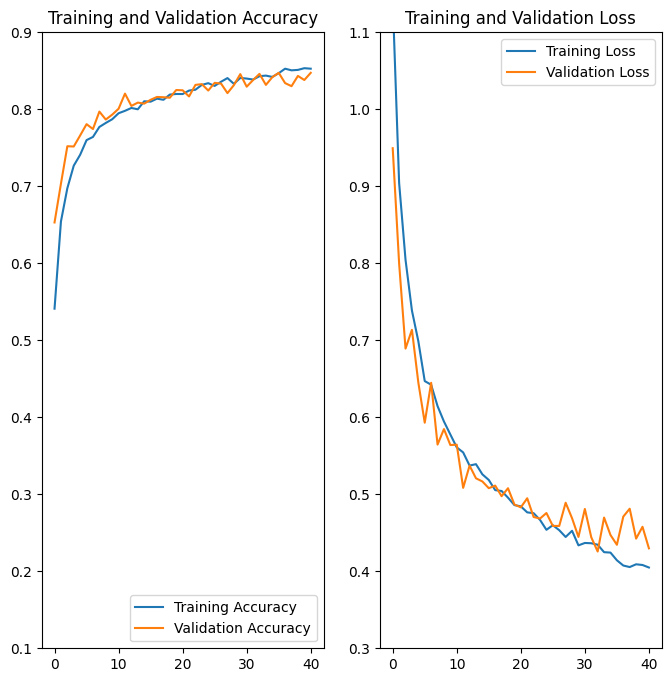

In [41]:
acc_conv = history_conv.history['accuracy']
val_acc_conv = history_conv.history['val_accuracy']

loss_conv = history_conv.history['loss']
val_loss_conv = history_conv.history['val_loss']

epochs_range = range(len(acc_conv))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc_conv, label='Training Accuracy')
plt.plot(epochs_range, val_acc_conv, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylim(0.1, .9)
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_conv, label='Training Loss')
plt.plot(epochs_range, val_loss_conv, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylim(0.3, 1.1)
plt.title('Training and Validation Loss')
plt.show()

Podemos ver que, a diferencia del modelo anterior donde únicamente se utilizaron capas densas, al sumarle capas convolucionales, las métricas duplican sus números y además se reduce en gran medida la cantidad de neuronas que el modelo precisa para predecir de manera correcta.

En cuanto a la gráfica, se ve que en este caso la validación y el entrenamiento están casi a la par, a diferencia del anterior modelo, donde la validación superaba por creces al entrenamiento. Gracias a que no fue necesario utilizar dropout, batch normalization o regularización para mejorar el modelo, únicamente data augmentation para mejorar los resultados en la validación.

1/1 [==============================] - 0s 60ms/step


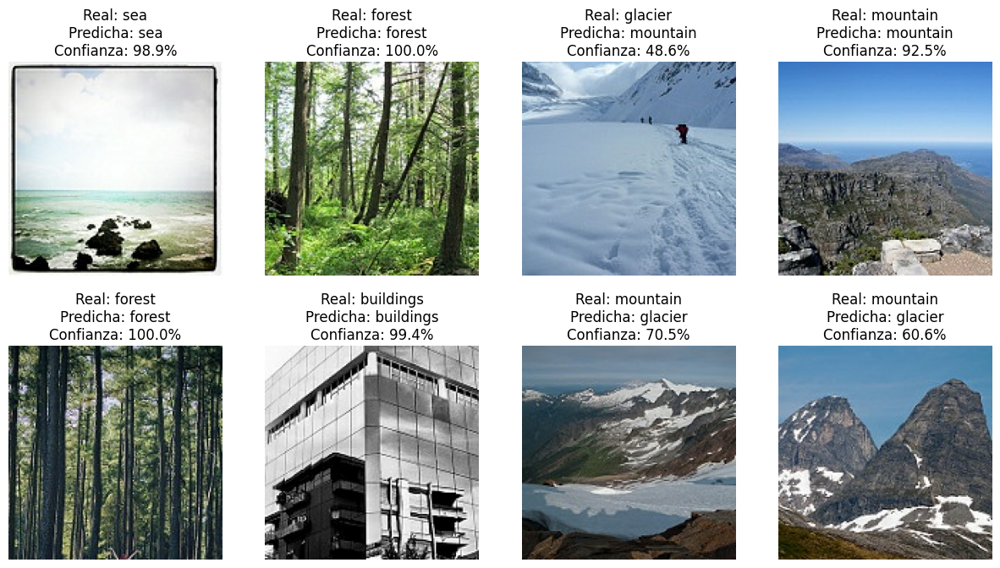

In [42]:
for images, labels in val_ds.take(1):
    preds = conv_model.predict(images)

true_classes = np.argmax(labels.numpy(), axis=1)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    confidence = np.max(preds[i]) * 100

    true_label = class_names[true_classes[i]]
    predicted_label = class_names[predicted_classes[i]]
    
    plt.title(f"Real: {true_label}\nPredicha: {predicted_label}\nConfianza: {confidence:.1f}%")
    plt.axis("off")

plt.show()

1/1 [==============================] - 0s 23ms/step


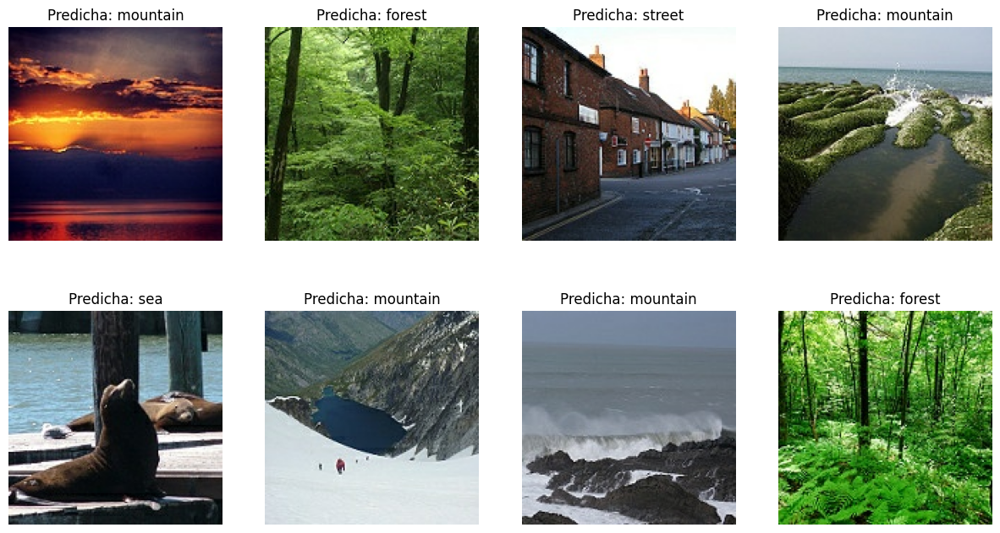

In [43]:
images_batch = next(iter(pred_ds.take(1)))
preds = conv_model.predict(images_batch)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images_batch[i].numpy().astype("uint8"))

    predicted_label = class_names[predicted_classes[i]]
    plt.title(f"Predicha: {predicted_label}")
    plt.axis("off")

plt.show()

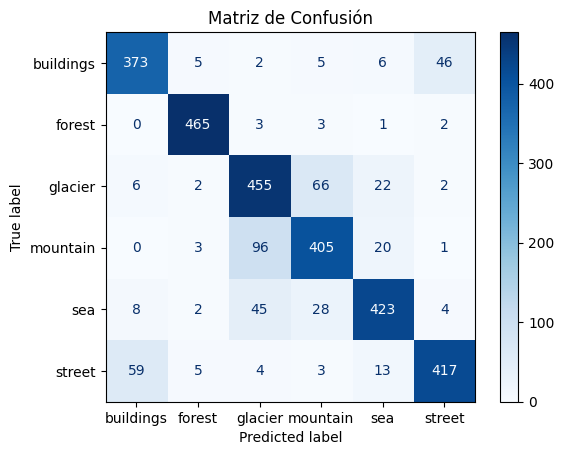

In [44]:
y_true_conv = []
y_pred_conv = []

for images, labels in val_ds:
    preds = conv_model.predict(images, verbose=0)
    y_true_conv.extend(np.argmax(labels.numpy(), axis=1))
    y_pred_conv.extend(np.argmax(preds, axis=1))


cm = confusion_matrix(y_true_conv, y_pred_conv)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues')
plt.title("Matriz de Confusión")
plt.show()

In [83]:
calcular_metricas(y_true_conv, y_pred_conv, class_names)

,Clase,Precisión (%),Recall (%),F1-Score (%)
0,buildings,0.836323,0.853547,0.844847
1,forest,0.964730,0.981013,0.972803
2,glacier,0.752066,0.822785,0.785838
3,mountain,0.794118,0.771429,0.782609
4,sea,0.872165,0.829412,0.850251
5,street,0.883475,0.832335,0.857143


Podemos ver cómo la matriz de confusión reafirma lo comentado anteriormente sobre la mejoría del modelo, no únicamente usando la métrica de accuracy para calcular, aumentando en por lo menos un 20% en cada métrica de cada clase, siendo nuevamente los bosques la clase con mejores métricas.

## Modelo con bloques residuales

Para el modelo con bloques residuales, tomamos la decisión de crear un modelo pequeño, similar al anterior (convolucional), agregando la estructura de los bloques residuales.

Para este modelo nos enfrentamos al hecho de que, para mejorarlo, había que aumentar en gran manera la cantidad de capas y neuronas en el modelo, aumentando únicamente pocos puntos en las métricas del modelo, además de que este parecía estar parcialmente underfitted y mostrando picos muy alternos para cada época.

In [13]:
def puente_module(x, filters):
    conv = Conv2D(filters, (3,3), padding='same')(x)
    conv = BatchNormalization()(conv,training=True)
    conv = Activation("relu")(conv)

    conv = Conv2D(3, (1,1), padding='same')(conv)
    conv = BatchNormalization()(conv,training=True)

    conv += x
    return conv


def build_model_residual(input_shape):
    i = Input(input_shape, dtype=tf.float32)

    x = Rescaling(1./255)(i)
    x = RandomFlip("horizontal")(x)
    x = RandomFlip("vertical")(x)
    x = RandomTranslation(0.1, 0.1, fill_mode="reflect")(x)
    x = RandomContrast(0.2)(x)

    x = puente_module(x, 32)
    x = Activation("relu")(x)

    x = puente_module(x, 64)
    x = Activation("relu")(x)

    x = puente_module(x, 128)
    x = Activation("relu")(x)

    x = Flatten()(x)
    x = Dropout(0.2)(x)
    x = Dense(6)(x)
    x = Activation("softmax")(x)
    return tf.keras.Model(inputs=i, outputs=x)

model_identidad = build_model_residual(input_shape=(150, 150, 3))
model_identidad.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 rescaling_1 (Rescaling)     (None, 150, 150, 3)          0         ['input_2[0][0]']             
                                                                                                  
 random_flip_2 (RandomFlip)  (None, 150, 150, 3)          0         ['rescaling_1[0][0]']         
                                                                                                  
 random_flip_3 (RandomFlip)  (None, 150, 150, 3)          0         ['random_flip_2[0][0]']       
                                                                                            

In [14]:
# optimizer = Adam(learning_rate=0.001)

model_identidad.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])

early_stopping = EarlyStopping(monitor="val_loss", patience=10, verbose=0, mode="min", restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(
    monitor="loss", factor=0.5, patience=3, verbose=1, min_delta=1e-4, mode="min"
)

history_residual = model_identidad.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    batch_size=16,
    callbacks=[reduce_lr, early_stopping],
)

Epoch 1/50
439/439 [==============================] - 42s 83ms/step - loss: 4.0884 - accuracy: 0.4059 - val_loss: 2.4455 - val_accuracy: 0.4193 - lr: 0.0010
Epoch 2/50
439/439 [==============================] - 30s 69ms/step - loss: 1.2919 - accuracy: 0.5340 - val_loss: 1.4567 - val_accuracy: 0.5143 - lr: 0.0010
Epoch 3/50
439/439 [==============================] - 31s 71ms/step - loss: 1.0187 - accuracy: 0.5979 - val_loss: 0.8916 - val_accuracy: 0.6723 - lr: 0.0010
Epoch 4/50
439/439 [==============================] - 32s 73ms/step - loss: 0.9044 - accuracy: 0.6528 - val_loss: 0.9653 - val_accuracy: 0.6517 - lr: 0.0010
Epoch 5/50
439/439 [==============================] - 29s 66ms/step - loss: 0.8641 - accuracy: 0.6675 - val_loss: 1.1680 - val_accuracy: 0.5907 - lr: 0.0010
Epoch 6/50
439/439 [==============================] - 29s 67ms/step - loss: 0.8332 - accuracy: 0.6826 - val_loss: 0.8283 - val_accuracy: 0.6997 - lr: 0.0010
Epoch 7/50
439/439 [==============================] - 28s 

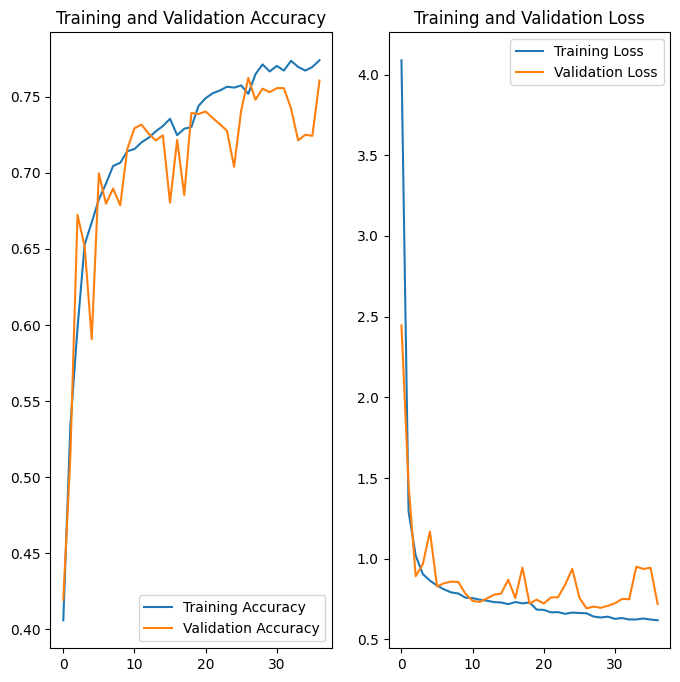

In [15]:
acc = history_residual.history['accuracy']
val_acc = history_residual.history['val_accuracy']

loss = history_residual.history['loss']
val_loss = history_residual.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Como se puede observar en la gráfica, este modelo es inferior al anterior por poco, además de finalizar su entrenamiento de manera más rápida.

1/1 [==============================] - 0s 206ms/step


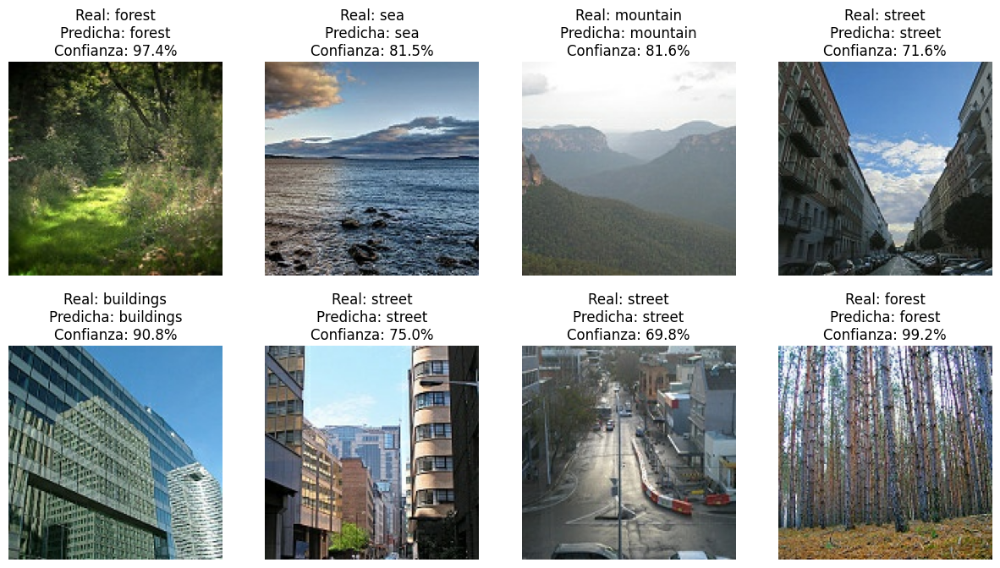

In [16]:
for images, labels in val_ds.take(1):
    preds = model_identidad.predict(images)

true_classes = np.argmax(labels.numpy(), axis=1)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    confidence = np.max(preds[i]) * 100

    true_label = class_names[true_classes[i]]
    predicted_label = class_names[predicted_classes[i]]
    
    plt.title(f"Real: {true_label}\nPredicha: {predicted_label}\nConfianza: {confidence:.1f}%")
    plt.axis("off")

plt.show()

1/1 [==============================] - 0s 25ms/step


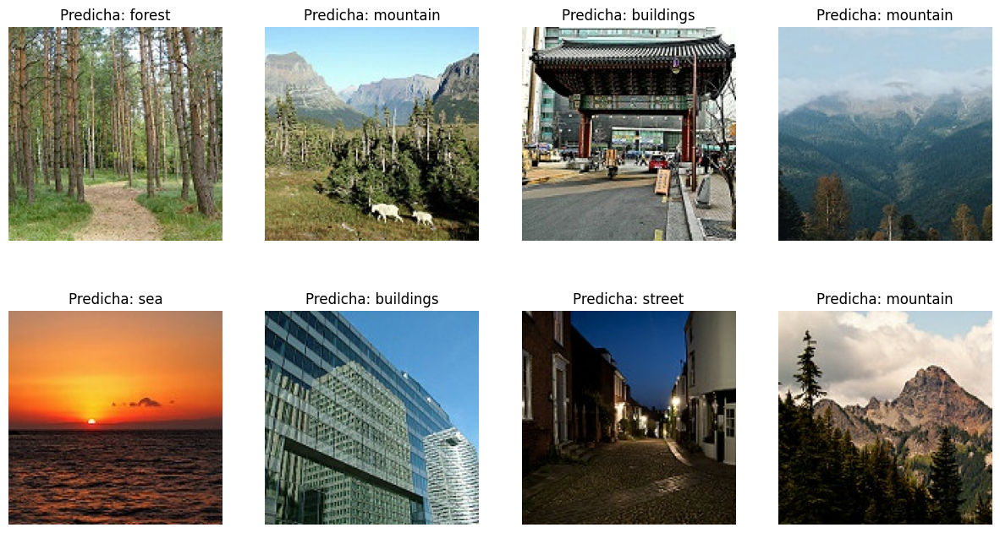

In [17]:
images_batch = next(iter(pred_ds.take(1)))
preds = model_identidad.predict(images_batch)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images_batch[i].numpy().astype("uint8"))

    predicted_label = class_names[predicted_classes[i]]
    plt.title(f"Predicha: {predicted_label}")
    plt.axis("off")

plt.show()

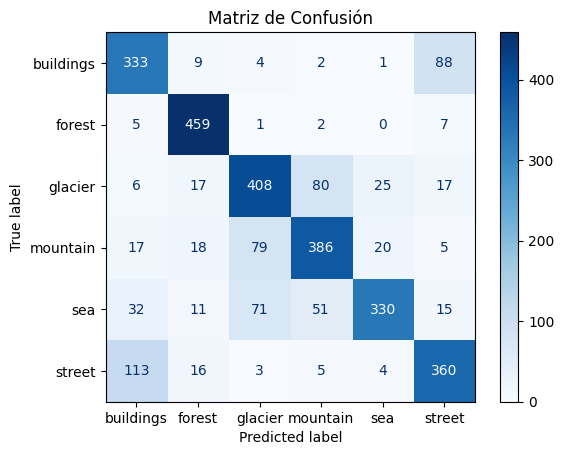

In [18]:
y_true_identidad = []
y_pred_identidad = []

for images, labels in val_ds:
    preds = model_identidad.predict(images, verbose=0)
    y_true_identidad.extend(np.argmax(labels.numpy(), axis=1))
    y_pred_identidad.extend(np.argmax(preds, axis=1))


cm = confusion_matrix(y_true_identidad, y_pred_identidad)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues')
plt.title("Matriz de Confusión")
plt.show()

In [22]:
calcular_metricas(y_true_identidad, y_pred_identidad, class_names)

,Clase,Precisión (%),Recall (%),F1-Score (%)
0,buildings,0.658103,0.762014,0.706257
1,forest,0.866038,0.968354,0.914343
2,glacier,0.720848,0.737794,0.729223
3,mountain,0.733840,0.735238,0.734539
4,sea,0.868421,0.647059,0.741573
5,street,0.731707,0.718563,0.725076


Como se mencionó más arriba, el modelo convolucional muestra ciertas mejorías en las métricas de precisión, recall y f1-score de las distintas clases, aunque en el caso de bosques, mantiene de manera muy similar y elevada sus métricas para todas.

## Modelo con transfer learning

Para el modelo de transfer learning, se probaron diversos modelos de CNN: (ConvNeXtSmall, ConvNeXtTiny, InceptionV3, etc.) En el caso de los modelos ConvNext, ambos mostraron resultados muy similares al EfficientNetV2S, que es el que terminamos eligiendo, siendo los resultados casi similares pero apenas peores, cambiando en ±0.01. 

No solo los resultados nos hicieron tomar la decisión de elegir el eficiente, sino que este entrenaba más rápido que los demás modelos. En el caso de utilizar modelos más pesados (más de 50 millones de parámetros), estos modelos daban métricas muy deficientes en comparación, dando métricas de entre 0.5 y 0.7 de accuracy, resultando peores que el modelo con capas convolucionales. Además eran muy lentos de entrenar por su elevada cantidad de parámetros. (A todos los distintos CNN se probaron variando la cantidad de capas y neuronas en cada uno.)

In [31]:
def build_model_transfer(input_shape):
    base_model = tf.keras.applications.EfficientNetV2S(input_shape=input_shape,
                                                include_top=False,
                                                weights='imagenet')
    base_model.trainable = False

    i = Input(shape=input_shape)
    x = base_model(i, training=False)
    x = GlobalMaxPooling2D()(x)
    x = Dense(32, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(6, activation='softmax')(x)

    return tf.keras.Model(i, x)

print("Building model")
transfer_model = build_model_transfer(input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

transfer_model.summary()

Building model
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 efficientnetv2-s (Function  (None, 5, 5, 1280)        20331360  
 al)                                                             
                                                                 
 global_max_pooling2d (Glob  (None, 1280)              0         
 alMaxPooling2D)                                                 
                                                                 
 dense_6 (Dense)             (None, 32)                40992     
                                                                 
 dropout_8 (Dropout)         (None, 32)                0         
                                                                 
 dense_7 (Dense)             (None, 64)     

In [32]:
optimizer = Adam(learning_rate=0.0001)

transfer_model.compile(
    optimizer=optimizer,
    loss="categorical_crossentropy",
    metrics=['accuracy'])

early_stopping = EarlyStopping(monitor="val_loss", patience=10, verbose=1, mode="min", restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(
    monitor="loss", factor=0.5, patience=5, verbose=1, min_delta=1e-4, mode="min"
)

history_transfer = transfer_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    batch_size=BATCH_SIZE,
    callbacks=[reduce_lr, early_stopping],
)

Epoch 1/50
439/439 [==============================] - 26s 41ms/step - loss: 1.2081 - accuracy: 0.5309 - val_loss: 0.4974 - val_accuracy: 0.8447 - lr: 1.0000e-04
Epoch 2/50
439/439 [==============================] - 15s 35ms/step - loss: 0.6575 - accuracy: 0.7539 - val_loss: 0.3656 - val_accuracy: 0.8737 - lr: 1.0000e-04
Epoch 3/50
439/439 [==============================] - 14s 32ms/step - loss: 0.5201 - accuracy: 0.8058 - val_loss: 0.3175 - val_accuracy: 0.8883 - lr: 1.0000e-04
Epoch 4/50
439/439 [==============================] - 14s 31ms/step - loss: 0.4547 - accuracy: 0.8322 - val_loss: 0.3001 - val_accuracy: 0.8927 - lr: 1.0000e-04
Epoch 5/50
439/439 [==============================] - 14s 32ms/step - loss: 0.4140 - accuracy: 0.8499 - val_loss: 0.2863 - val_accuracy: 0.9003 - lr: 1.0000e-04
Epoch 6/50
439/439 [==============================] - 14s 32ms/step - loss: 0.3855 - accuracy: 0.8633 - val_loss: 0.2746 - val_accuracy: 0.9030 - lr: 1.0000e-04
Epoch 7/50
439/439 [==============

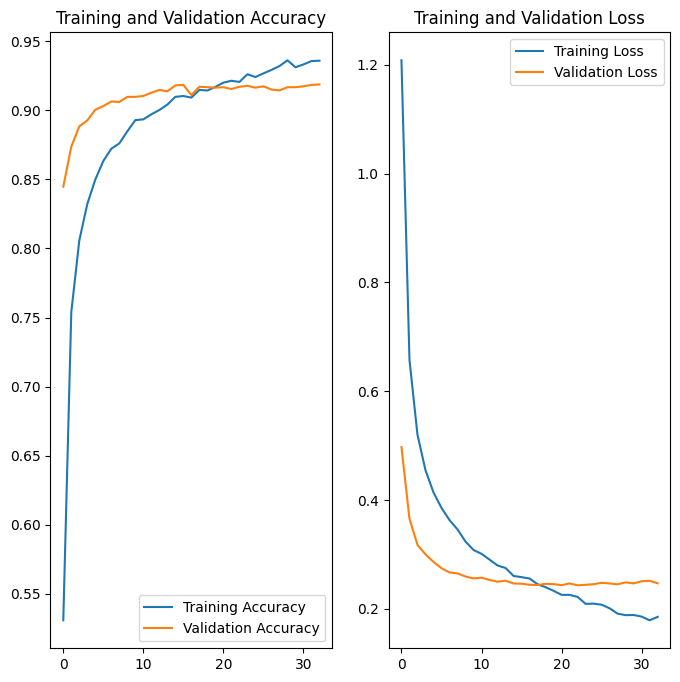

In [33]:
acc_transfer = history_transfer.history['accuracy']
val_acc_transfer = history_transfer.history['val_accuracy']

loss_transfer = history_transfer.history['loss']
val_loss_transfer = history_transfer.history['val_loss']

epochs_range = range(len(acc_transfer))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc_transfer, label='Training Accuracy')
plt.plot(epochs_range, val_acc_transfer, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_transfer, label='Training Loss')
plt.plot(epochs_range, val_loss_transfer, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Podemos ver de los resultados y los gráficos que casi no necesitan muchas épocas para entrenar, empezando muchas veces por arriba del 0.65 de accuracy. Además, únicamente estamos entrenando 45 mil parámetros, una fracción en comparación con los modelos entrenados anteriormente.

1/1 [==============================] - 2s 2s/step


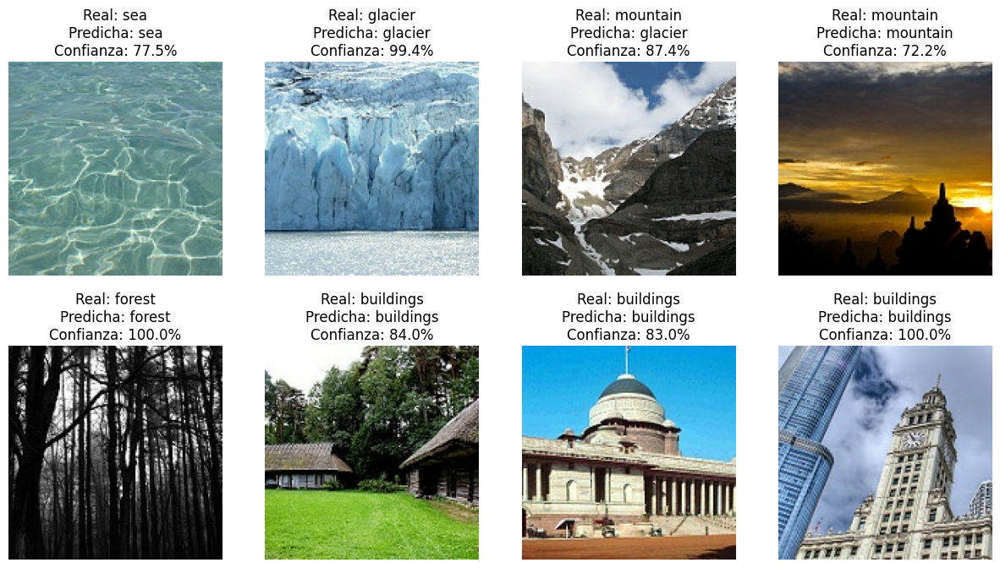

In [34]:
for images, labels in val_ds.take(1):
    preds = transfer_model.predict(images)

true_classes = np.argmax(labels.numpy(), axis=1)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    confidence = np.max(preds[i]) * 100

    true_label = class_names[true_classes[i]]
    predicted_label = class_names[predicted_classes[i]]
    
    plt.title(f"Real: {true_label}\nPredicha: {predicted_label}\nConfianza: {confidence:.1f}%")
    plt.axis("off")

plt.show()

1/1 [==============================] - 0s 30ms/step


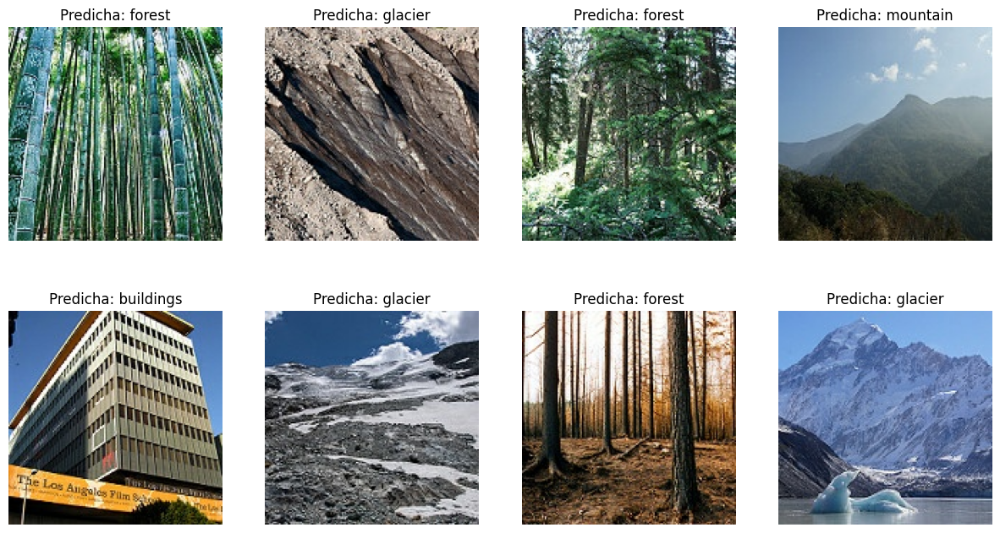

In [35]:
images_batch = next(iter(pred_ds.take(1)))
preds = transfer_model.predict(images_batch)
predicted_classes = np.argmax(preds, axis=1)

N = 8
plt.figure(figsize=(15, 8))

for i in range(N):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images_batch[i].numpy().astype("uint8"))

    predicted_label = class_names[predicted_classes[i]]
    plt.title(f"Predicha: {predicted_label}")
    plt.axis("off")

plt.show()

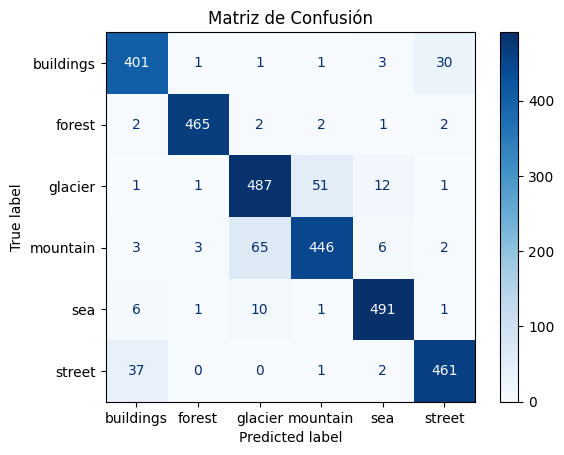

In [36]:
y_true_transfer = []
y_pred_transfer = []

for images, labels in val_ds:
    preds = transfer_model.predict(images, verbose=0)
    y_true_transfer.extend(np.argmax(labels.numpy(), axis=1))
    y_pred_transfer.extend(np.argmax(preds, axis=1))


cm = confusion_matrix(y_true_transfer, y_pred_transfer)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues')
plt.title("Matriz de Confusión")
plt.show()

In [70]:
calcular_metricas(y_true_transfer, y_pred_transfer, class_names)

,Clase,Precisión (%),Recall (%),F1-Score (%)
0,buildings,89.111111,91.762014,90.417136
1,forest,98.726115,98.101266,98.412698
2,glacier,86.194690,88.065099,87.119857
3,mountain,88.844622,84.952381,86.854917
4,sea,95.339806,96.274510,95.804878
5,street,92.756539,92.015968,92.384770


Como vemos, en comparación con el resto de modelos, utilizar un transfer learning muestra las mejores métricas entre todos los modelos, siendo nuevamente los bosques la clase que mejor métricas da, no mejorando mucho en comparación, ya que en el modelo de capas convolucionales, los bosques pasan el 90% en las diferentes métricas.

## Conclusiones

In [ ]:
y_trues = [y_true, y_true_conv, y_true_identidad, y_true_transfer]
y_preds = [y_pred, y_pred_conv, y_pred_identidad, y_pred_transfer]
model_names = ["Modelo Dense", "Modelo Conv", "Modelo Transfer", "Modelo Efficien"]
df = calcular_metricas_modelos(y_trues, y_preds, model_names, class_names)

df_ordenado = df.set_index(['Modelo', 'Clase'])
df_ordenado

Accuracy (%)  Precisión (%)  Recall (%)  \
Modelo          Clase                                                
Modelo Dense    buildings      0.870000       0.674074    0.208238   
                forest         0.913333       0.725738    0.725738   
                glacier        0.845000       0.565089    0.690778   
                mountain       0.858000       0.580227    0.681905   
                sea            0.841000       0.567347    0.272549   
                street         0.820000       0.477140    0.812375   
                PROMEDIO       0.573667       0.598269    0.565264   
Modelo Conv     buildings      0.954333       0.836323    0.853547   
                forest         0.991333       0.964730    0.981013   
                glacier        0.917333       0.752066    0.822785   
                mountain       0.925000       0.794118    0.771429   
                sea            0.950333       0.872165    0.829412   
                street         0.953667       0.883475    0.832335   
                PROMEDIO       0.846000       0.850479    0.848420   
Modelo Transfer buildings      0.869333       0.544554    0.629291   
                forest         0.942000       0.765957    0.911392   
                glacier        0.865333       0.657505    0.562387   
                mountain       0.846333       0.554983    0.615238   
                sea            0.853000       0.585608    0.462745   
                street         0.898000       0.706131    0.666667   
                PROMEDIO       0.637000       0.635790    0.641287   
Modelo Efficien buildings      0.971667       0.891111    0.917620   
                forest         0.995000       0.987261    0.981013   
                glacier        0.952000       0.861947    0.880651   
                mountain       0.955000       0.888446    0.849524   
                sea            0.985667       0.953398    0.962745   
                street         0.974667       0.927565    0.920160   
                PROMEDIO       0.917000       0.918288    0.918619   

                           F1-Score (%)  
Modelo          Clase                    
Modelo Dense    buildings      0.318182  
                forest         0.725738  
                glacier        0.621644  
                mountain       0.626970  
                sea            0.368212  
                street         0.601182  
                PROMEDIO       0.543655  
Modelo Conv     buildings      0.844847  
                forest         0.972803  
                glacier        0.785838  
                mountain       0.782609  
                sea            0.850251  
                street         0.857143  
                PROMEDIO       0.848915  
Modelo Transfer buildings      0.583864  
                forest         0.832370  
                glacier        0.606238  
                mountain       0.583559  
                sea            0.516977  
                street         0.685832  
                PROMEDIO       0.634807  
Modelo Efficien buildings      0.904171  
                forest         0.984127  
                glacier        0.871199  
                mountain       0.868549  
                sea            0.958049  
                street         0.923848  
                PROMEDIO       0.918324

Como conclusión de este trabajo de clasificación de imágenes en el que se probaron distintas arquitecturas, pudimos notar la gran mejoría del modelo al momento de aplicar las distintas capas convolucionales, diferenciándolo en el caso en el que únicamente usábamos capas densas, esto obviamente por estar trabajando con imágenes. Otro punto a tener en cuenta es la posibilidad de utilizar redes entrenadas como transfer learning, donde conseguimos las mejores métricas sin elaborar una red compleja. 

El mayor problema al que nos enfrentamos fue si valía la pena agrandar exponencialmente los parámetros de los modelos por unas pocas mejoras en las métricas, además de en el caso del modelo de bloques residuales, donde para que diera métricas correctas, había que mensurar de gran manera los parámetros, llegando a tener la misma cantidad que los modelos de transfer learning que probamos y que daban mejores métricas.